In [1]:
import topologic
import graspologic
import networkx as nx

import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# First simulation

We sample 2-block SBMs (undirected, no self-loops) with 50 vertices, each block containing 25 vertices (n = [25, 25]), and the following block probabilities:

\begin{align*}
P_1 = 
\begin{bmatrix}0.3 & 0.1\\
0.1 & 0.7
\end{bmatrix},~
P_2 = \begin{bmatrix}0.3 & 0.1\\
0.1 & 0.3
\end{bmatrix}
\end{align*}

The only difference between the two are the block probability for the second block. We sample $G_1 \sim \text{SBM}(n, P_1)$ and $G_2 \sim \text{SBM}(n, P_2)$.

In [2]:
from graspologic.simulations import sbm

m = 100
n = [m, m]
P1 = [[.3, .1], 
      [.1, .7]]
P2 = [[.3, .1], 
      [.1, .3]]

np.random.seed(8)
G1 = nx.to_networkx_graph(sbm(n, P1), create_using=nx.Graph)
G2 = nx.to_networkx_graph(sbm(n, P2), create_using=nx.Graph)
G = [G1, G2]

## Visualize the graphs using heatmap

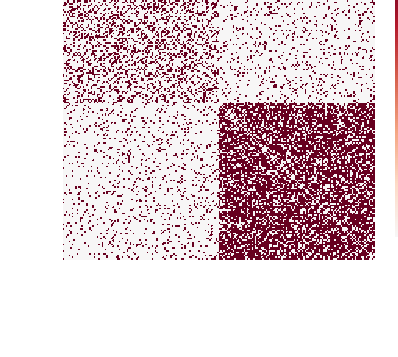

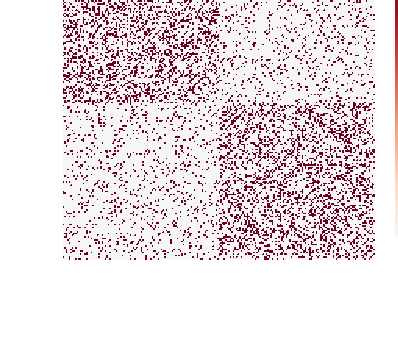

In [3]:
from graspologic.plot import heatmap

heatmap(G1, figsize=(7, 7), title='Visualization of Graph 1')
_ = heatmap(G2, figsize=(7, 7), title='Visualization of Graph 2')

## Embed the two graphs using omnibus embedding

The first embedding is LSE-OMNI from graspologic

The second embedding is LSE-OMNI from topologic

In [4]:
from graspologic.embed import OmnibusEmbed
from topologic.embedding import omnibus_embedding

embedder = OmnibusEmbed(n_components=2, lse=True)
Zhat_gp = embedder.fit_transform(G)
print(Zhat_gp.shape)

Zhat_tc = omnibus_embedding(G, maximum_dimensions=10)
Zhat_tc = Zhat_tc[0]

(2, 200, 2)


## Visualize the embedding

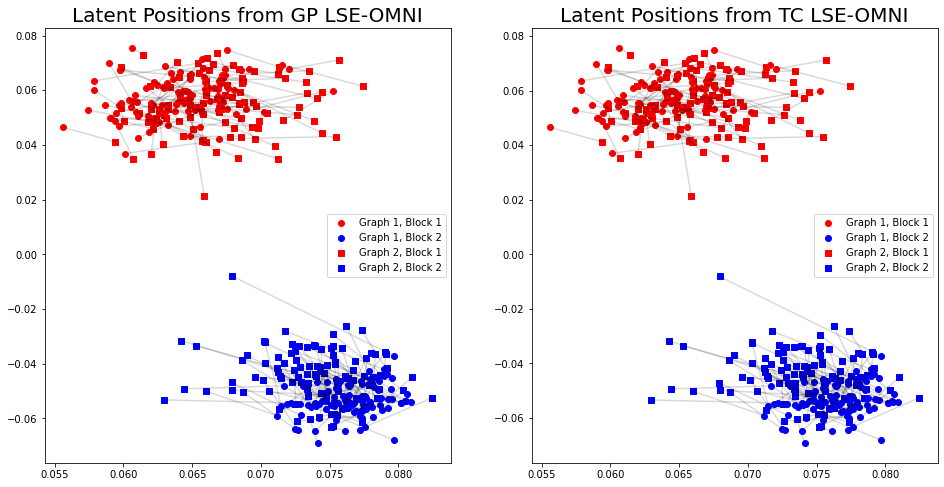

In [5]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

Xhat1 = Zhat_gp[0]
Xhat2 = Zhat_gp[1]

# Plot the points
ax1.scatter(Xhat1[:m, 0], Xhat1[:m, 1], marker='o', c='red', label = 'Graph 1, Block 1')
ax1.scatter(Xhat1[m:, 0], Xhat1[m:, 1], marker='o', c='blue', label = 'Graph 1, Block 2')
ax1.scatter(Xhat2[:m, 0], Xhat2[:m, 1], marker='s', c='red', label = 'Graph 2, Block 1')
ax1.scatter(Xhat2[m:, 0], Xhat2[m:, 1], marker='s', c='blue', label= 'Graph 2, Block 2')
ax1.legend()

# Plot lines between matched pairs of points
for i in range(2*m):
    ax1.plot([Xhat1[i, 0], Xhat2[i, 0]], [Xhat1[i, 1], Xhat2[i, 1]], 'black', alpha = 0.15)
    
_ = ax1.set_title('Latent Positions from GP LSE-OMNI', fontsize=20)


Xhat3 = Zhat_tc[0].embedding
Xhat4 = Zhat_tc[1].embedding

# Plot the points
ax2.scatter(Xhat3[:m, 0], Xhat3[:m, 1], marker='o', c='red', label = 'Graph 1, Block 1')
ax2.scatter(Xhat3[m:, 0], Xhat3[m:, 1], marker='o', c='blue', label = 'Graph 1, Block 2')
ax2.scatter(Xhat4[:m, 0], Xhat4[:m, 1], marker='s', c='red', label = 'Graph 2, Block 1')
ax2.scatter(Xhat4[m:, 0], Xhat4[m:, 1], marker='s', c='blue', label= 'Graph 2, Block 2')
ax2.legend()

# Plot lines between matched pairs of points
for i in range(2*m):
    ax2.plot([Xhat3[i, 0], Xhat4[i, 0]], [Xhat3[i, 1], Xhat4[i, 1]], 'black', alpha = 0.15)
    
_ = ax2.set_title('Latent Positions from TC LSE-OMNI', fontsize=20)


In [7]:
print(np.linalg.norm(Xhat1 - Xhat3))
print(np.linalg.norm(Xhat2 - Xhat4))

0.0012787454678019367
0.0018114466348084163
